# 1.- Data Visualization and Analysis

In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from PIL import Image
from skimage import feature

from sklearn.cluster import KMeans

from tqdm import tqdm

In [7]:
base_path = '../data/raw/archive/ISatelitales'

## Class Counts by Folder

Identifying whether the dataset is imbalanced (some classes have far more images than others).

In [12]:
class_counts = {folder: len(os.listdir(os.path.join(base_path, folder))) for folder in os.listdir(base_path)}
pd.Series(class_counts)

airplane                 700
airport                  700
baseball_diamond         700
basketball_court         700
beach                    700
bridge                   700
chaparral                700
church                   700
circular_farmland        700
cloud                    700
commercial_area          700
dense_residential        700
desert                   700
forest                   700
freeway                  700
golf_course              700
ground_track_field       700
harbor                   700
industrial_area          700
intersection             700
island                   700
lake                     700
meadow                   700
medium_residential       700
mobile_home_park         700
mountain                 700
overpass                 700
palace                   700
parking_lot              700
railway                  700
railway_station          700
rectangular_farmland     700
river                    700
roundabout               700
runway        

## Displaying Sample Images in a Grid

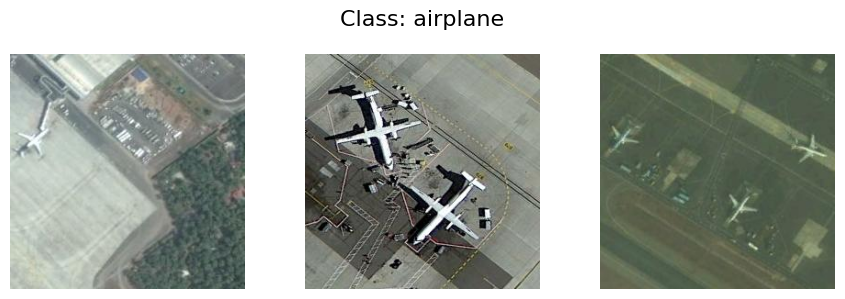

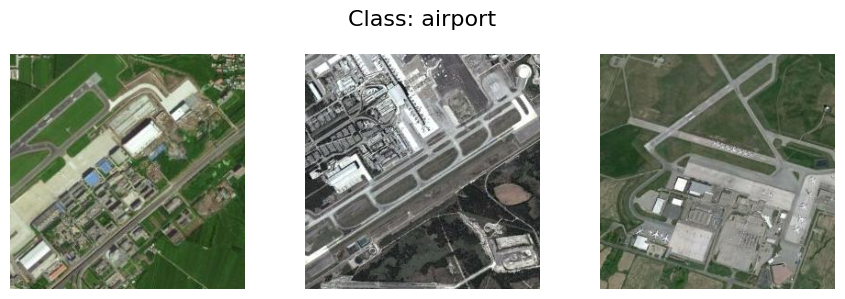

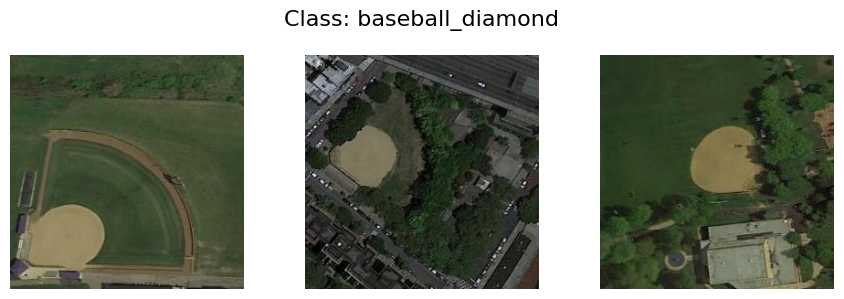

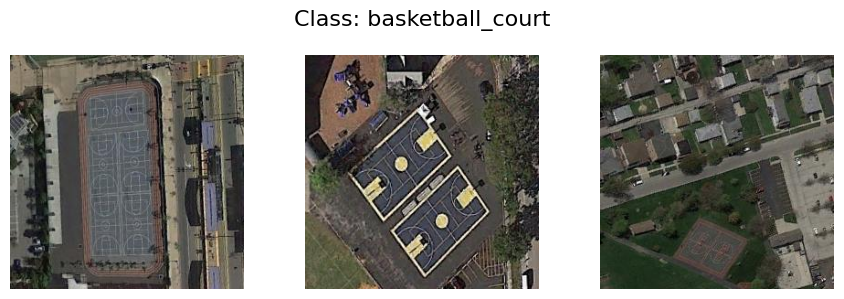

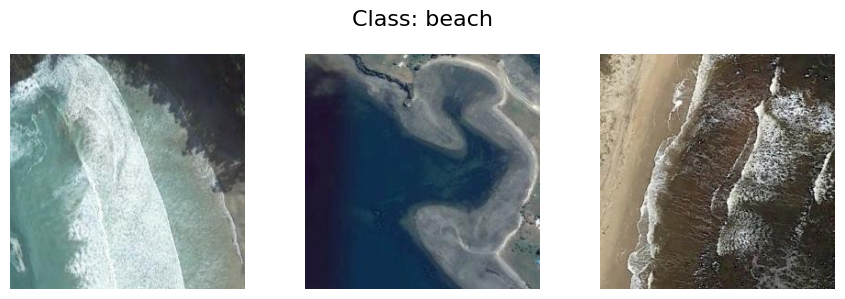

...

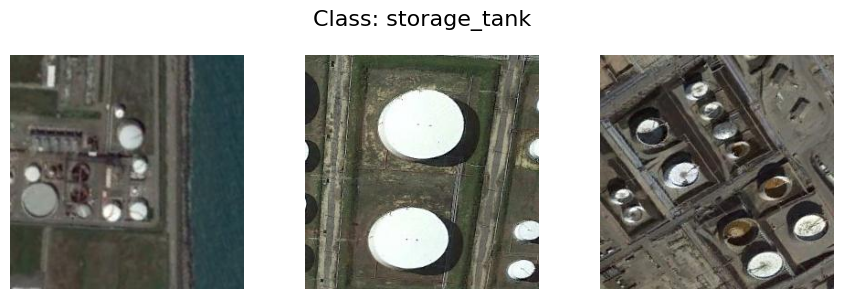

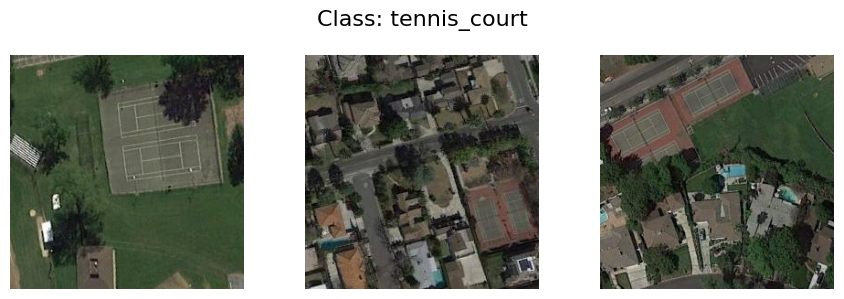

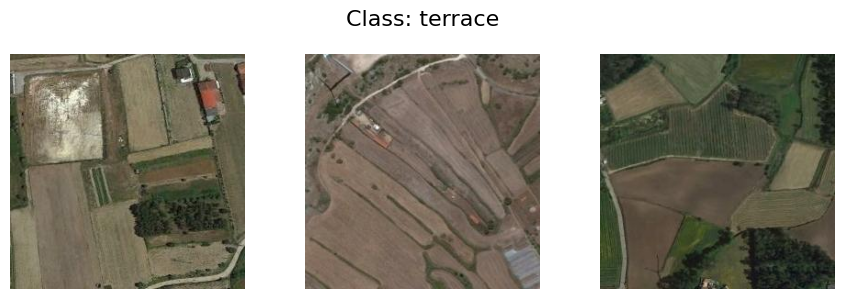

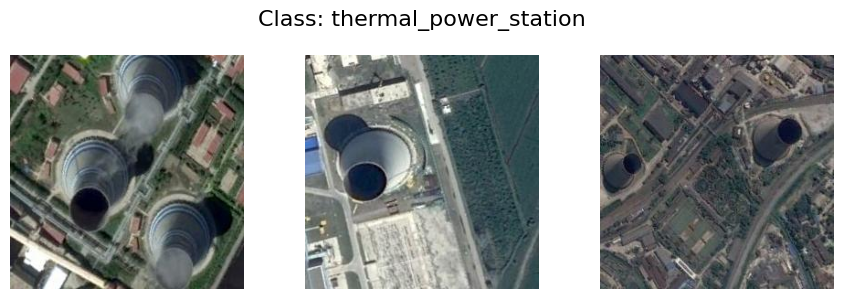

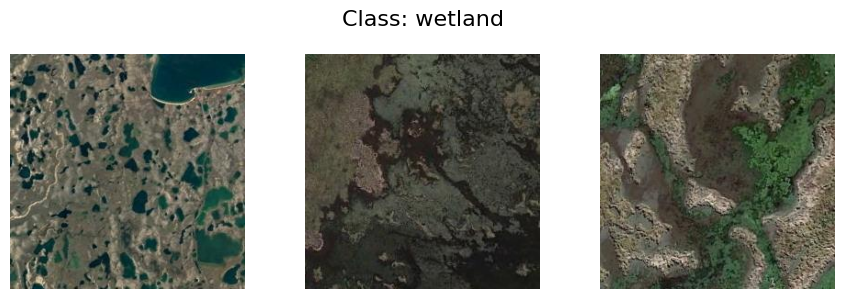

In [9]:
def show_sample_images_grid(base_path, num_samples=3, image_size=(3, 3)):
    """
    Displays sample images in a grid for each class.
    
    Parameters:
    - base_path: Base path where class folders are located.
    - num_samples: Number of images per class to display.
    - image_size: Size of each image in the grid (width, height).
    """
    for class_name in os.listdir(base_path):
        class_path = os.path.join(base_path, class_name)
        sample_images = random.sample(os.listdir(class_path), min(num_samples, len(os.listdir(class_path))))
        
        # Create a figure for the grid
        fig, axes = plt.subplots(1, num_samples, figsize=(image_size[0] * num_samples, image_size[1]))
        fig.suptitle(f"Class: {class_name}", fontsize=16)
        
        # Display each image in a grid cell
        for ax, img_file in zip(axes, sample_images):
            img_path = os.path.join(class_path, img_file)
            img = plt.imread(img_path)
            ax.imshow(img)
            ax.axis('off')  # Hide axes
        plt.tight_layout()
        plt.show()

# Call the function with the base path to the images
show_sample_images_grid(base_path)



## Unique Image Dimensions

In [13]:
image_dimensions = set()
for class_folder in os.listdir(base_path):
    folder_path = os.path.join(base_path, class_folder)
    for img_file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_file)
        with Image.open(img_path) as img:
            image_dimensions.add(img.size)

print("Unique Dimensions Found:", image_dimensions)

Unique Dimensions Found: {(256, 256)}


## Edge Complexity Distribution

Processing Images: 100%|██████████| 31500/31500 [04:42<00:00, 111.64it/s]


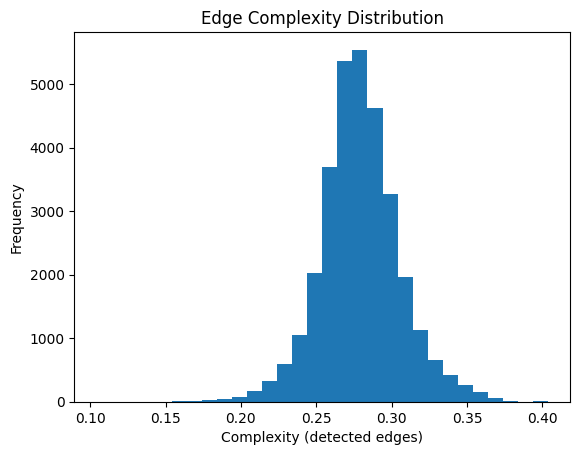

In [10]:
def compute_edge_complexities_with_progress(base_path):
    """
    Compute edge complexities of images with a progress bar showing completion status.
    
    Parameters:
    - base_path: Base directory containing class folders of images.
    """
    edge_complexities = []
    total_images = sum(len(files) for _, _, files in os.walk(base_path))

    with tqdm(total=total_images, desc="Processing Images") as pbar:
        for class_folder in os.listdir(base_path):
            folder_path = os.path.join(base_path, class_folder)
            for img_file in os.listdir(folder_path):
                img_path = os.path.join(folder_path, img_file)
                img = plt.imread(img_path)
                if img.ndim == 3:
                    img = np.mean(img, axis=2)
                edges = feature.canny(img, sigma=1)
                edge_complexities.append(np.mean(edges))
                pbar.update(1)

    plt.hist(edge_complexities, bins=30)
    plt.title("Edge Complexity Distribution")
    plt.xlabel("Complexity (detected edges)")
    plt.ylabel("Frequency")
    plt.show()

# Call the function with the base path to the images
compute_edge_complexities_with_progress(base_path)
